In [2]:
import xarray as xr
import pandas as pd
import os
import cmasher as cmr
import numpy as np
import warnings
import matplotlib.pyplot as plt

warnings.filterwarnings('ignore')

In [3]:
#Loading data
os.chdir('/Volumes/PtatoBasket/ACIML/Outputs/Sheets_of_ML/')
DATA=pd.read_excel(r'ML5-Winter.xlsx',sheet_name='Sheet1')

## Sensitivity

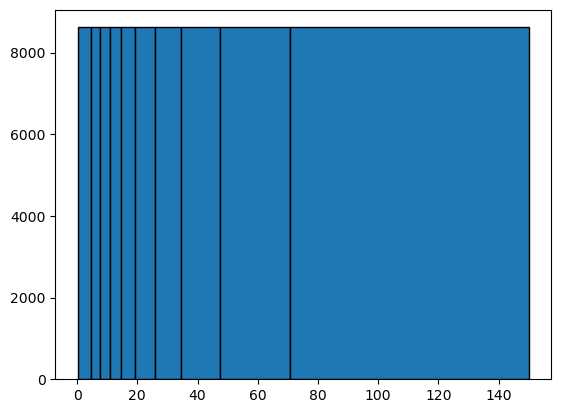

In [8]:
bins=10
data=DATA.AI
data=data[data<1]
def equalObs(x,nBin):
    nlen=len(x)
    return np.interp(np.linspace(0,nlen,nBin+1),
                     np.arange(nlen),
                     np.sort(x))
    
n, bins, patches = plt.hist(data,equalObs(data,bins), edgecolor='black')
plt.show()

In [5]:
from scipy import stats

data=DATA
data=data[(np.abs(stats.zscore(data))<3).all(axis=1)]

bins = ['0','0.1','0.2','0.3','0.4','0.5','0.6','0.7','0.8','0.9','1']
labels = ['0.1','0.2','0.3','0.4','0.5','0.6','0.7','0.8','0.9','1']

data['Groups'] = pd.cut(x = data['AI'], bins = bins, labels = labels, include_lowest = True).dropna()
data.head()

,PBLH,WindDirection-850,MeanWind-850,RH,V-850,SMOKE-AOD,DUST-AOD,AI,PrecipitableVapour,LTS,Nd,CloudRadius,LWP,Groups
2,255.892899,138.707581,3.424276,29.153403,0.068386,0.600887,0.021372,0.978743,3.244,18.697113,2.106769,27.189999,22,1
3,219.253647,148.424805,3.427996,30.685003,0.048773,0.442203,0.018311,0.706756,2.113,17.618347,6.902716,27.549999,88,0.8
4,405.194489,90.385742,1.313045,13.929752,0.040155,0.427391,0.021718,0.688385,1.826,17.981293,109.095881,10.340000,49,0.7
5,510.463470,141.873657,3.311537,25.812240,0.107613,0.591726,0.030624,0.967241,1.912,17.333862,83.748404,16.800000,35,1
8,231.870102,96.169525,1.654795,30.618650,0.042830,0.237673,0.051058,0.365789,2.307,16.183319,28.770264,14.680000,29,0.4


In [6]:
LWP=data.LWP
AI=data.AI
Nd=data.Nd
RH=data.RH
LTS=data.LTS
W=data['V-850']
MW=data['MeanWind-850']
WV=data.PrecipitableVapour

# For Spliting High and Low

In [7]:
# # For RH
# sp=RH.quantile(.5)
# L_DATA=data.loc[data.RH<sp]
# H_DATA=data.loc[data.RH>sp]

# For WV
sp=WV.quantile(.5)
L_DATA=data.loc[data.PrecipitableVapour<sp]
H_DATA=data.loc[data.PrecipitableVapour>sp]

# For LTS
# sp=LTS.quantile(.5)
# L_DATA=data.loc[LTS<sp]
# H_DATA=data.loc[LTS>sp]


# For W
# sp=0
# L_DATA=data.loc[W<sp]
# H_DATA=data.loc[W>sp]




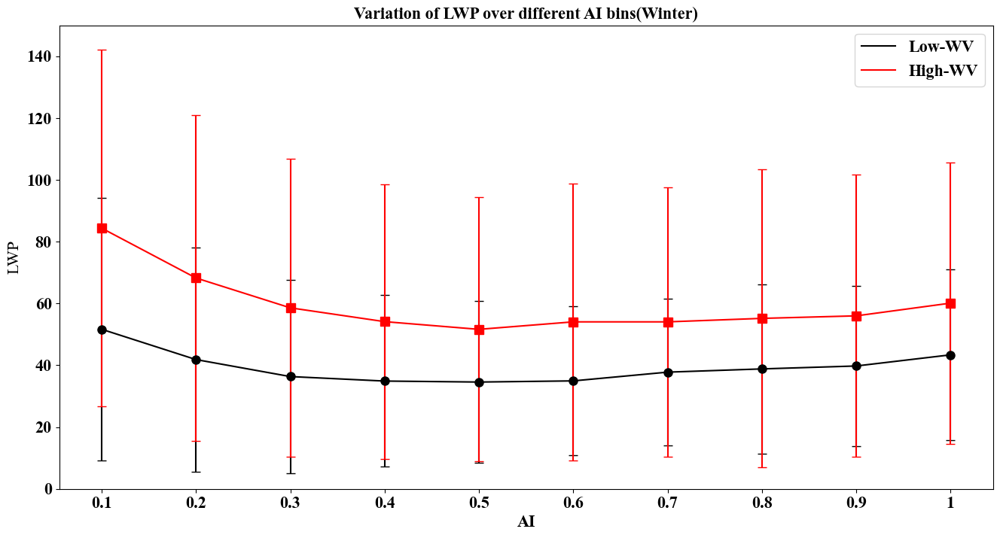

In [10]:

font = {'weight' : 'bold',
        'size'   : 16}
plt.rcParams["font.family"] = "Times New Roman"
plt.rc('font', **font)
# plt.xlabel()

fig, ax = plt.subplots(figsize=(16, 8))

# Calculate the mean and standard deviation by group
grouped = L_DATA.groupby('Groups')['LWP'].agg(['mean', 'std'])
ax.errorbar(grouped.index, grouped['mean'], yerr=grouped['std'], fmt='o', capsize=4,color='black',markersize=8)
xx=L_DATA.groupby('Groups').mean()
ax.plot(xx.LWP,color='black', label='Low-WV')

grouped = H_DATA.groupby('Groups')['LWP'].agg(['mean', 'std'])
ax.errorbar(grouped.index, grouped['mean'], yerr=grouped['std'], fmt='s', capsize=4,color='red',markersize=8)
xx=H_DATA.groupby('Groups').mean()
ax.plot(xx.LWP,color='red', label='High-WV')
ax.legend(loc='upper right')

plt.xlabel("AI", **font)
plt.ylabel("LWP")
plt.ylim(0,150)

plt.title('Variation of LWP over different AI bins(Winter)',**font)
os.chdir('/Volumes/PtatoBasket/ACIML/Outputs/VARIATION_PLOTS')
# plt.savefig('VP-Ww.png',dpi=300)
plt.show()

<AxesSubplot: xlabel='Groups', ylabel='LWP'>

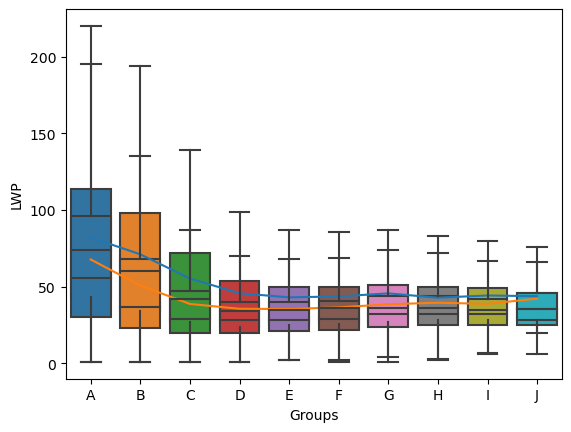

In [51]:
import seaborn as sns

fig,ax=plt.subplots()

xx=L_DATA.groupby('Groups').mean()
ax.plot(xx.LWP)
sns.boxplot(x=L_DATA['Groups'],
            y=L_DATA['LWP'],
            showfliers=False)

xx=H_DATA.groupby('Groups').mean()
ax.plot(xx.LWP)
sns.boxplot(x=H_DATA['Groups'],
            y=H_DATA['LWP'],
            showfliers=False)

In [5]:
percentiles=[DATA.AI.quantile(.05), DATA.AI.quantile(.35), DATA.AI.quantile(.65), DATA.AI.quantile(.95)]

LWP1=LWP.loc[(AI>percentiles[0]) & (AI<percentiles[1])]
AI1=AI.loc[(AI>percentiles[0]) & (AI<percentiles[1])]

LWP2=LWP.loc[(AI>percentiles[1]) & (AI<percentiles[2])]
AI2=AI.loc[(AI>percentiles[1]) & (AI<percentiles[2])]

LWP3=LWP.loc[(AI>percentiles[2]) & (AI<percentiles[3])]
AI3=AI.loc[(AI>percentiles[2]) & (AI<percentiles[3])]


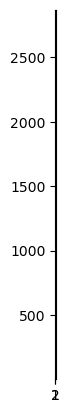

In [6]:
from sklearn.linear_model import LinearRegression
linear_regressor = LinearRegression()  # create object for the class

fig = plt.figure()
ax1 = fig.add_subplot(111)
# ax1.hist2d((AI),(LWP), bins=(500, 500), cmap='cmr.apple_r')
heatmap, xedges, yedges = np.histogram2d(AI, LWP, bins=50)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
plt.hist2d(AI, LWP, bins=(500, 500), cmap='cmr.apple_r',density=True)

plt.clf()
plt.imshow(heatmap.T, extent=extent, origin='lower')



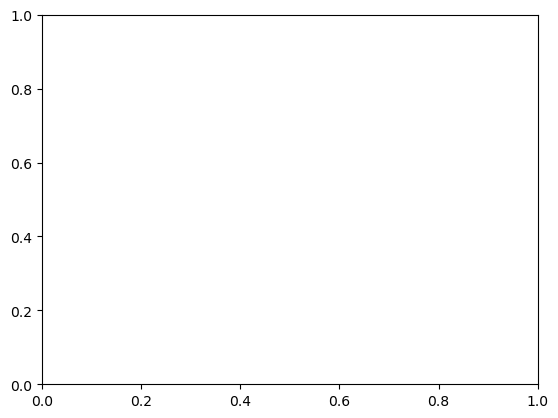

In [7]:

# ax1.scatter(AI1, LWP1, c='b', marker="s", label='first')

X = AI1.values.reshape(-1, 1)  # values converts it into a numpy array
Y = LWP1.values.reshape(-1, 1)

linear_regressor.fit(X, Y)  # perform linear regression
Y_pred = linear_regressor.predict(X)


ax1.plot(X, Y_pred, color='red')

# ax1.scatter(AI2,LWP2, c='r', marker="o", label='second')

X = AI2.values.reshape(-1, 1)  # values converts it into a numpy array
Y = LWP2.values.reshape(-1, 1)

linear_regressor.fit(X, Y)  # perform linear regression
Y_pred = linear_regressor.predict(X)
ax1.plot(X, Y_pred, color='Black')

# ax1.scatter(AI3, LWP3, c='b', marker="s", label='Third')

X = AI3.values.reshape(-1, 1)  # values converts it into a numpy array
Y = LWP3.values.reshape(-1, 1)

linear_regressor.fit(X, Y)  # perform linear regression
Y_pred = linear_regressor.predict(X)
ax1.plot(X, Y_pred, color='red')
plt.xlim(0, 1)
# plt.ylim(0, 100)

# plt.xscale('log')
# plt.yscale('log')

# plt.yticks([3,10,30,100,300], [3,10,30,100,300])
# plt.xticks([3,10,30,100,300], [3,10,30,100,300])
plt.show()

<Figure size 640x480 with 0 Axes>

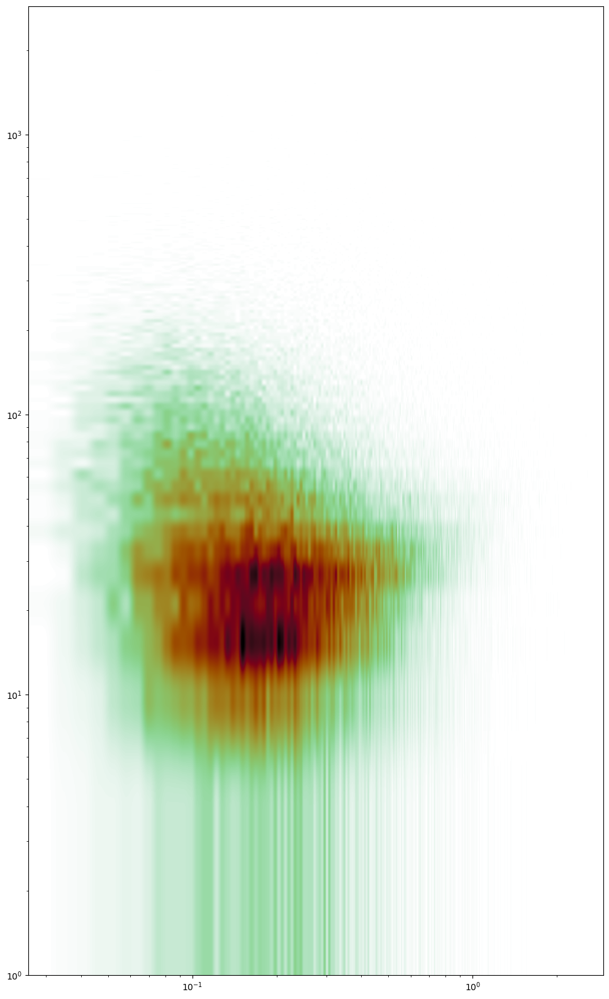

In [15]:
import numpy as np
import numpy.random
import matplotlib.pyplot as plt

plt.clf()

fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot()
# Generate some test data
x = np.random.randn(8873)
y = np.random.randn(8873)

heatmap, xedges, yedges = np.histogram2d(AI, LWP, bins=(500,500))
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]


plt.xticks([.1, .5, 1], [.1, .5, 1])

plt.xscale('log')
plt.yscale('log')
plt.imshow(heatmap.T, extent=extent, origin='lower',cmap='cmr.apple_r')


plt.show()

In [37]:
import plotly.express as px
import plotly.graph_objects as go
import statsmodels.api as sm

fig=px.density_heatmap(DATA, y='LWP',x='Nd')

##########
X = DATA.Nd.loc[(DATA.Nd<10)]
Y = DATA.LWP.loc[(DATA.Nd<10)]

Y=sm.OLS(Y.values,sm.add_constant(X)).fit().fittedvalues
fig.add_trace(go.Scatter(x=X,y=Y,mode='lines'))
#########
X = DATA.Nd.loc[(DATA.Nd>10) & (DATA.Nd<20)]
Y = DATA.LWP.loc[(DATA.Nd>10) & (DATA.Nd<20)]

Y=sm.OLS(Y.values,sm.add_constant(X)).fit().fittedvalues
fig.add_trace(go.Scatter(x=X,y=Y,mode='lines'))
#########
X = DATA.Nd.loc[(DATA.Nd>20)]
Y = DATA.LWP.loc[(DATA.Nd>20)]

Y=sm.OLS(Y.values,sm.add_constant(X)).fit().fittedvalues
fig.add_trace(go.Scatter(x=X,y=Y,mode='lines'))
##########


# X = AI2.values
# Y=sm.OLS(LWP2.values,sm.add_constant(X)).fit().fittedvalues
# fig.add_trace(go.Scatter(x=X,y=Y,mode='lines'))

# X = AI3.values
# Y=sm.OLS(LWP3.values,sm.add_constant(X)).fit().fittedvalues
# fig.add_trace(go.Scatter(x=X,y=Y,mode='lines'))

# fig
fig.update_xaxes(range=[0,100])
fig.update_yaxes(range=[0,250])

fig.show()

In [22]:
# Create a Linear Regression model
import plotly.graph_objects as go
import pandas as pd
from sklearn.linear_model import LinearRegression

df=DATA
model = LinearRegression()

# Fit the model using the two parameters from the DataFrame
X = df['LWP'].values.reshape(-1, 1)
y = df['Nd']
model.fit(X, y)

# Create x values for the regression line
x_range = np.linspace(X.min(), X.max(), 100)

# Predict y values for the regression line
y_range = model.predict(x_range.reshape(-1, 1))

# Create a line plot with the regression line
fig = px.density_heatmap(DATA, x='LWP',y='Nd')
fig.add_trace(go.Scatter(x=x_range, y=y_range, mode='lines'))

fig.update_xaxes(range=[0,70])
fig.update_yaxes(range=[30,36])

fig.show()